In [ ]:
!nvidia-smi

Sat Apr 13 15:42:48 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0


In [1]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
from ultralytics import YOLO

model = YOLO('yolov9c.pt')

model.info()

FileNotFoundError: [Errno 2] No such file or directory: 'yolov9c.pt'

In [4]:
!pip install ultralytics==8.0.196

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 30.0/78.2 GB disk)


In [5]:
from ultralytics import YOLO

from IPython.display import display, Image

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="ReF71OL1b3mRAl8BdMOY")
project = rf.workspace("gongmo").project("flame-bkxfb")
version = project.version(1)
dataset = version.download("yolov9")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to flame-1 in yolov9:: 100%|██████████| 18708/18708 [00:04<00:00, 4123.62it/s]


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd drive/MyDrive/Saqta
!ls

/content/drive/MyDrive/Saqta


/content


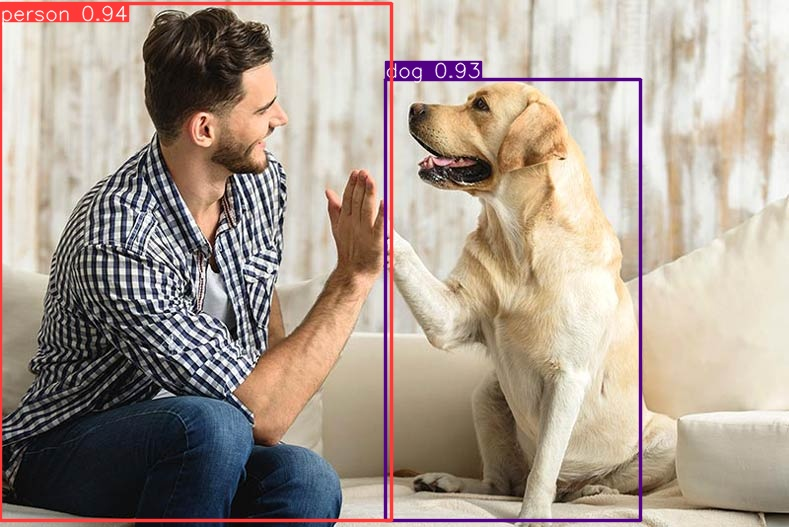

In [ ]:
%cd {HOME}
Image(filename='/content/runs/detect/predict/Yellow-Lab-High-Five.jpg', height=600)

In [ ]:
model = YOLO(f'{HOME}/yolov8n.pt')
results = model.predict(source='/content/Yellow-Lab-High-Five.jpg', conf=0.25)


image 1/1 /content/Yellow-Lab-High-Five.jpg: 448x640 1 person, 1 dog, 9.3ms
Speed: 2.2ms preprocess, 9.3ms inference, 2.4ms postprocess per image at shape (1, 3, 448, 640)


In [ ]:
results[0].boxes.xyxy

tensor([[4.2596e-01, 3.5434e+00, 3.9127e+02, 5.2052e+02],
        [3.8506e+02, 7.9814e+01, 6.4077e+02, 5.2053e+02]], device='cuda:0')

In [ ]:
results[0].boxes.conf

tensor([0.9381, 0.9253], device='cuda:0')

In [ ]:
results[0].boxes.cls

tensor([ 0., 16.], device='cuda:0')

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="ReF71OL1b3mRAl8BdMOY")
project = rf.workspace("gongmo").project("flame-bkxfb")
version = project.version(1)
dataset = version.download("yolov9")


loading Roboflow workspace...
loading Roboflow project...


In [ ]:
!yolo task=detect mode=train model=yolov9c.pt data={dataset.location}/data.yaml epochs=25 imgsz=640 plots=True

Ultralytics YOLOv8.1.47 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov9c.pt, data=/content/flame-1/data.yaml, epochs=25, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show

In [ ]:
!ls

drive  flame-1


In [ ]:
from ultralytics import YOLO

model = YOLO('yolov9c.yaml')

model = YOLO('yolov9c.pt')

model.info()

100%|██████████| 49.4M/49.4M [00:00<00:00, 188MB/s]


YOLOv9c summary: 618 layers, 25590912 parameters, 0 gradients, 104.0 GFLOPs


(618, 25590912, 0, 104.02268160000003)

In [ ]:
!pip install ultralytics

In [ ]:
!ls {HOME}/runs/detect/train/

args.yaml					     labels.jpg    train_batch0.jpg
confusion_matrix_normalized.png			     P_curve.png   train_batch1.jpg
confusion_matrix.png				     PR_curve.png  train_batch2.jpg
events.out.tfevents.1712409603.12e78bf94e5c.14549.0  R_curve.png   val_batch0_labels.jpg
F1_curve.png					     results.csv   val_batch0_pred.jpg
labels_correlogram.jpg				     results.png   weights


In [ ]:
!yolo task=detect mode=predict model=runs/detect/train3/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True

Ultralytics YOLOv8.1.47 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c summary (fused): 384 layers, 25320019 parameters, 0 gradients, 102.3 GFLOPs

image 1/953 /content/flame-1/test/images/frame_001_jpg.rf.75018369e5fb8ecd9f83b4501f8384ae.jpg: 640x640 1 flame, 51.7ms
image 2/953 /content/flame-1/test/images/frame_002_jpg.rf.b94a7c180b583e5cf76f6385913efbbe.jpg: 640x640 1 flame, 49.6ms
image 3/953 /content/flame-1/test/images/frame_003_jpg.rf.38d17081b7e4bd7c6a07971f6c096f6d.jpg: 640x640 1 flame, 49.5ms
image 4/953 /content/flame-1/test/images/frame_003_jpg.rf.63debbb3d1a1dca4d80270506c0897fb.jpg: 640x640 1 flame, 49.5ms
image 5/953 /content/flame-1/test/images/frame_003_jpg.rf.e83d88926b9393615d6ef9a1337ace9a.jpg: 640x640 1 flame, 32.1ms
image 6/953 /content/flame-1/test/images/frame_004_jpg.rf.72bffe9da6f7a93c9fc445b762d61f60.jpg: 640x640 1 flame, 29.6ms
image 7/953 /content/flame-1/test/images/frame_005_jpg.rf.a369f64ebbad4cbceeb6c38be0e39c86.jpg: 640x640 1 fl

In [ ]:
!ls

drive  flame-1	runs  yolov8n.pt  yolov8s.pt  yolov9c.pt


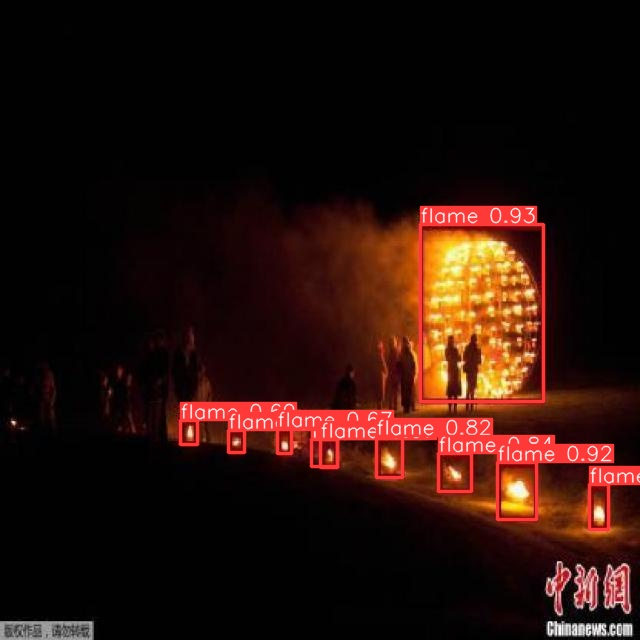

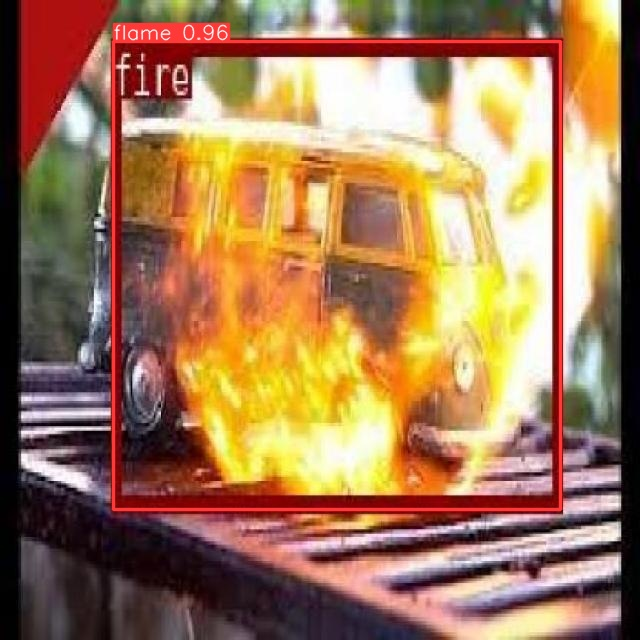

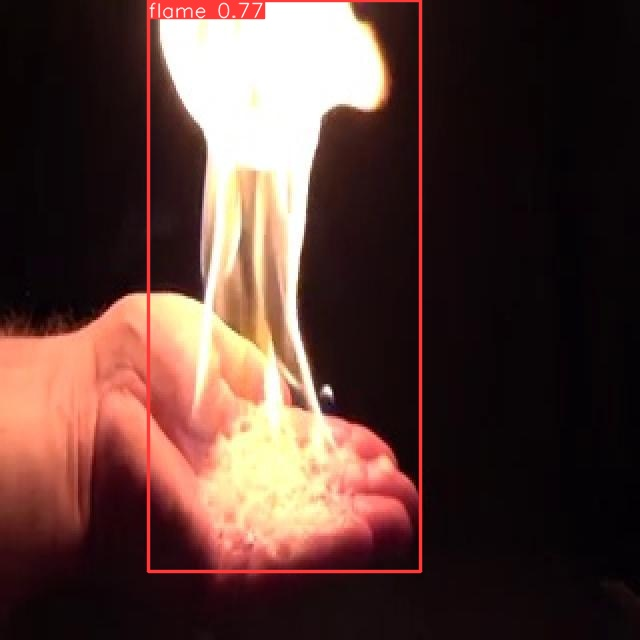

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'runs/detect/predict/*.jpg')[:3]:
      display(Image(filename=image_path, width=600))
      print("\n")

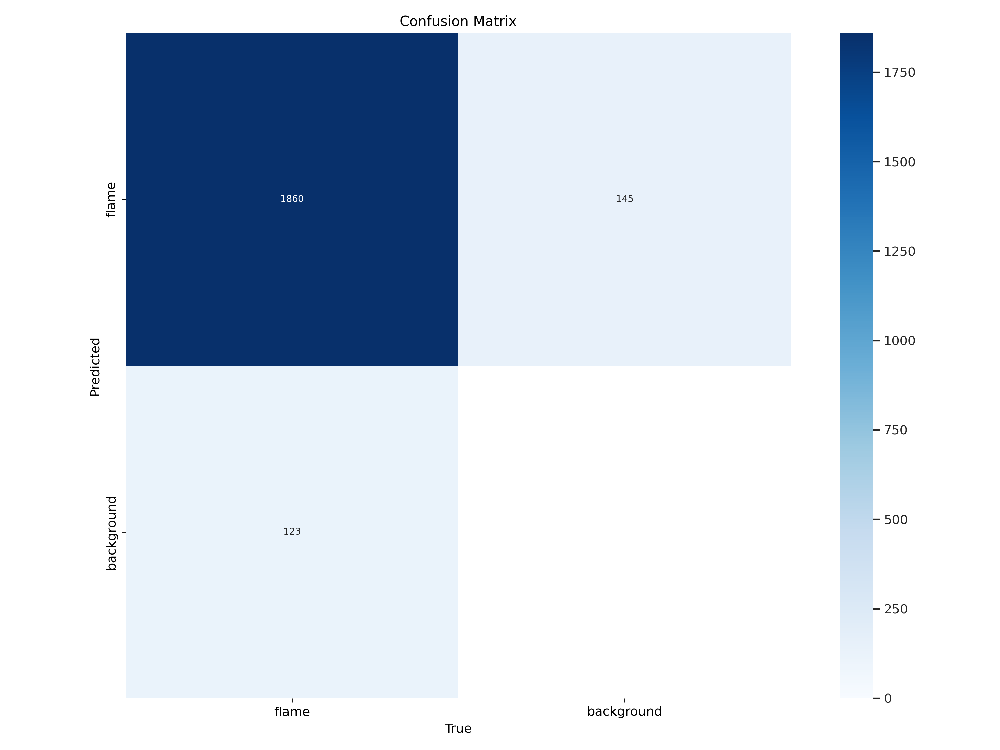

In [6]:
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)

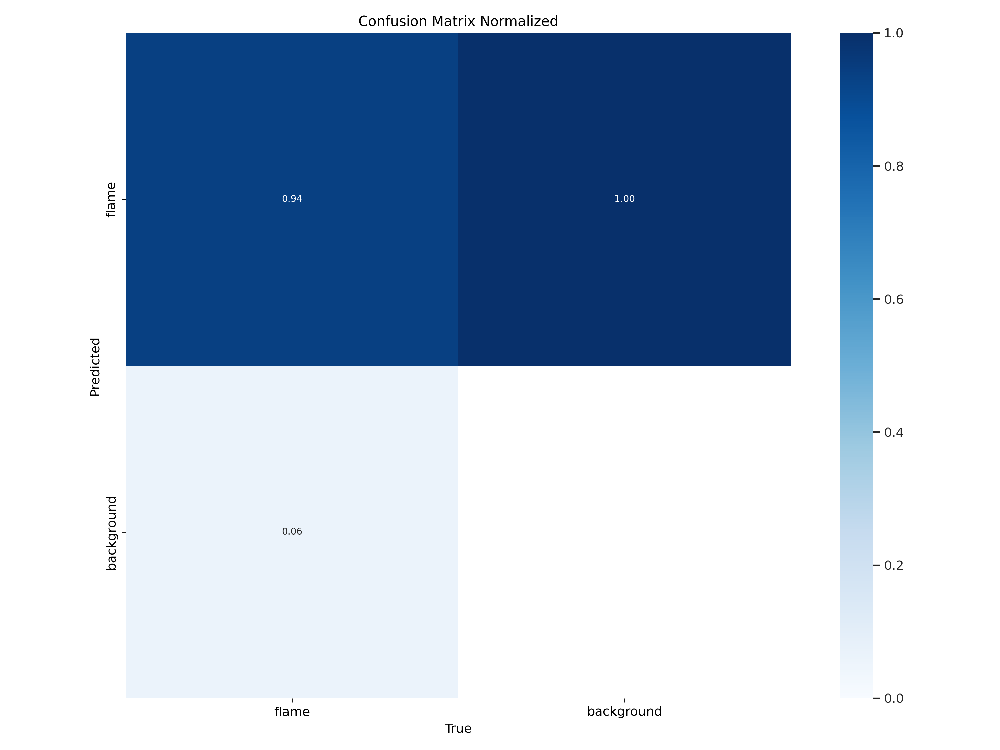

In [7]:
Image(filename=f'{HOME}/runs/detect/train3/confusion_matrix_normalized.png', width=600)

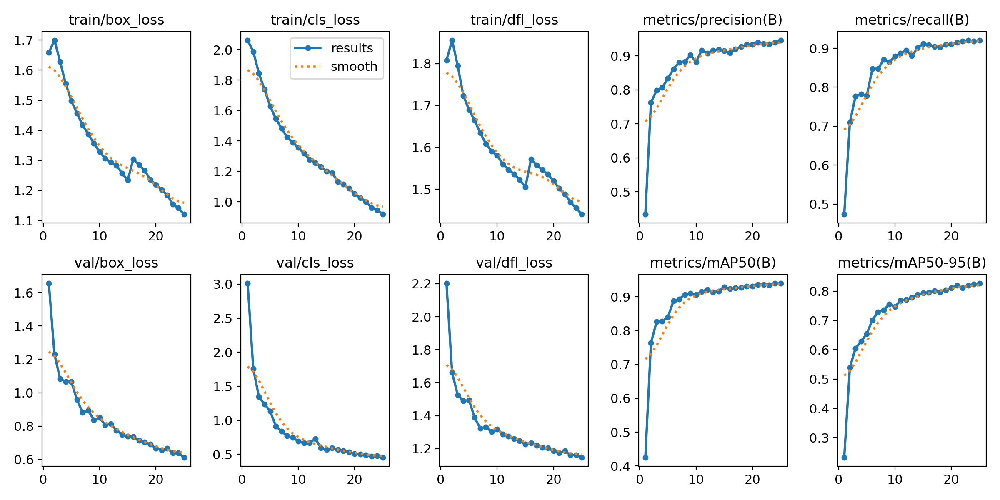

In [8]:
Image(filename=f'{HOME}/runs/detect/train3/results.png', width=600)

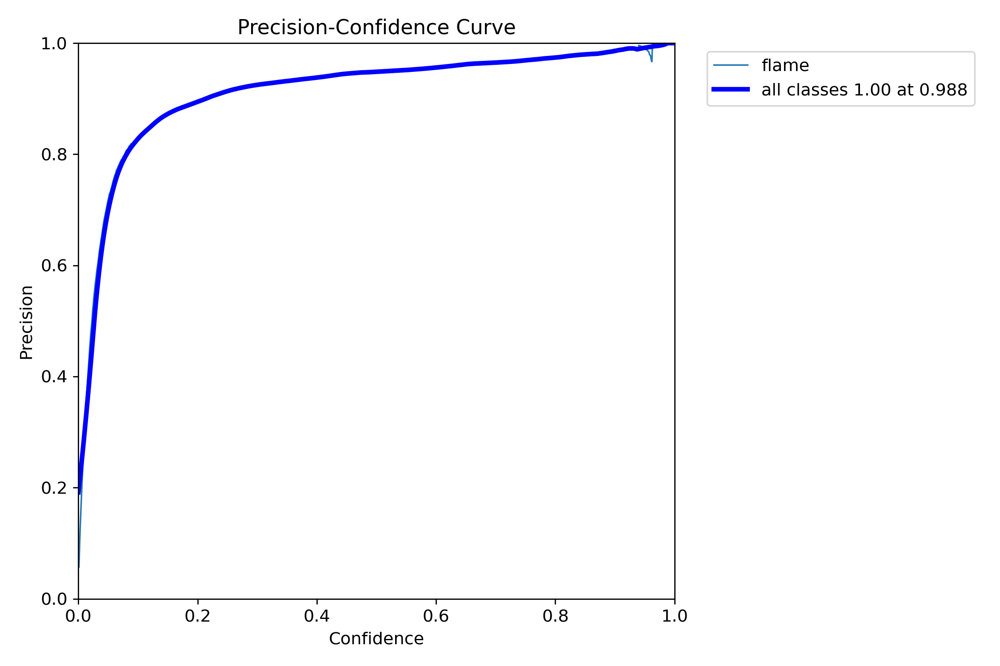

In [10]:
Image(filename=f'{HOME}/runs/detect/train3/P_curve.png', width=600)

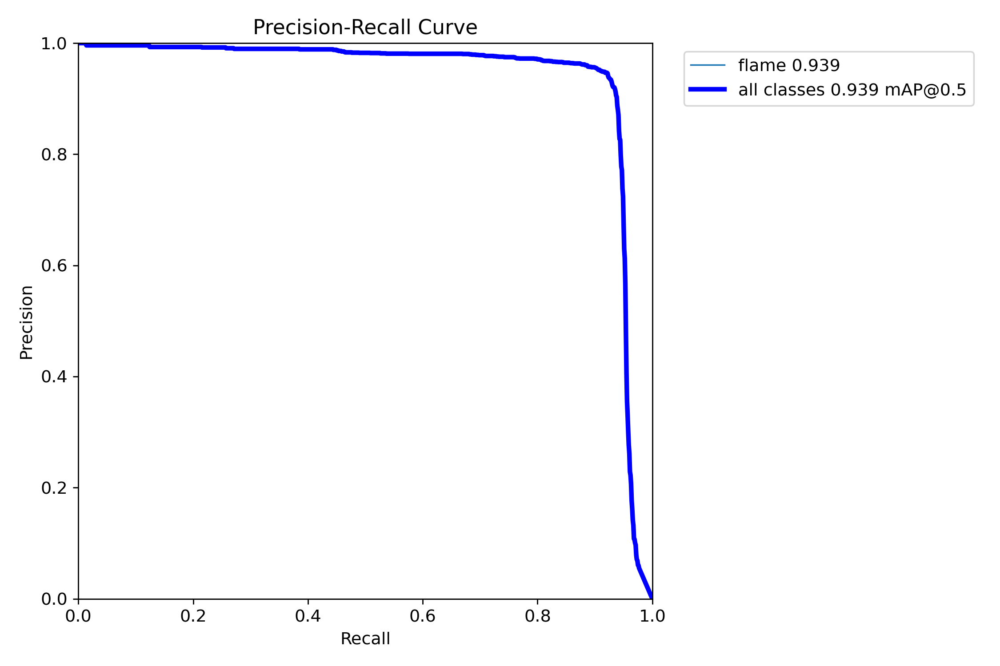

In [12]:
Image(filename=f'{HOME}/runs/detect/train3/PR_curve.png', width=600)

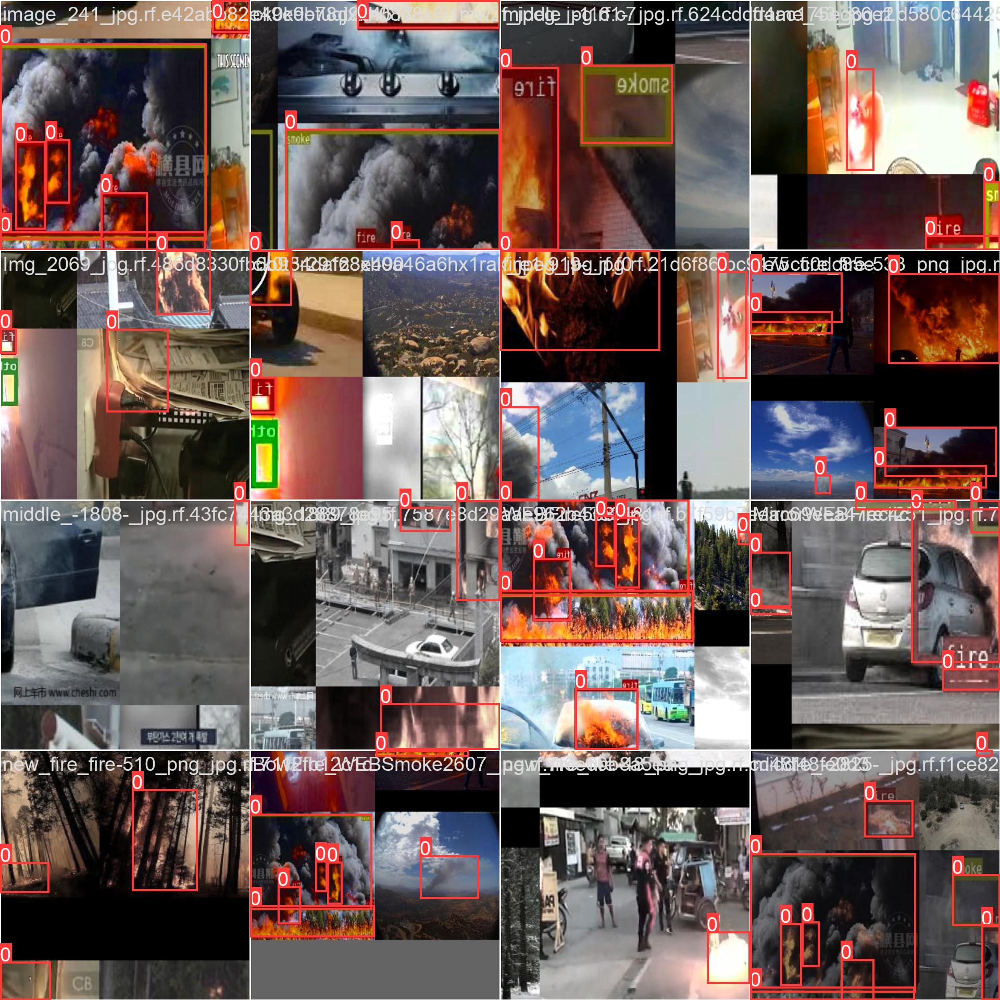

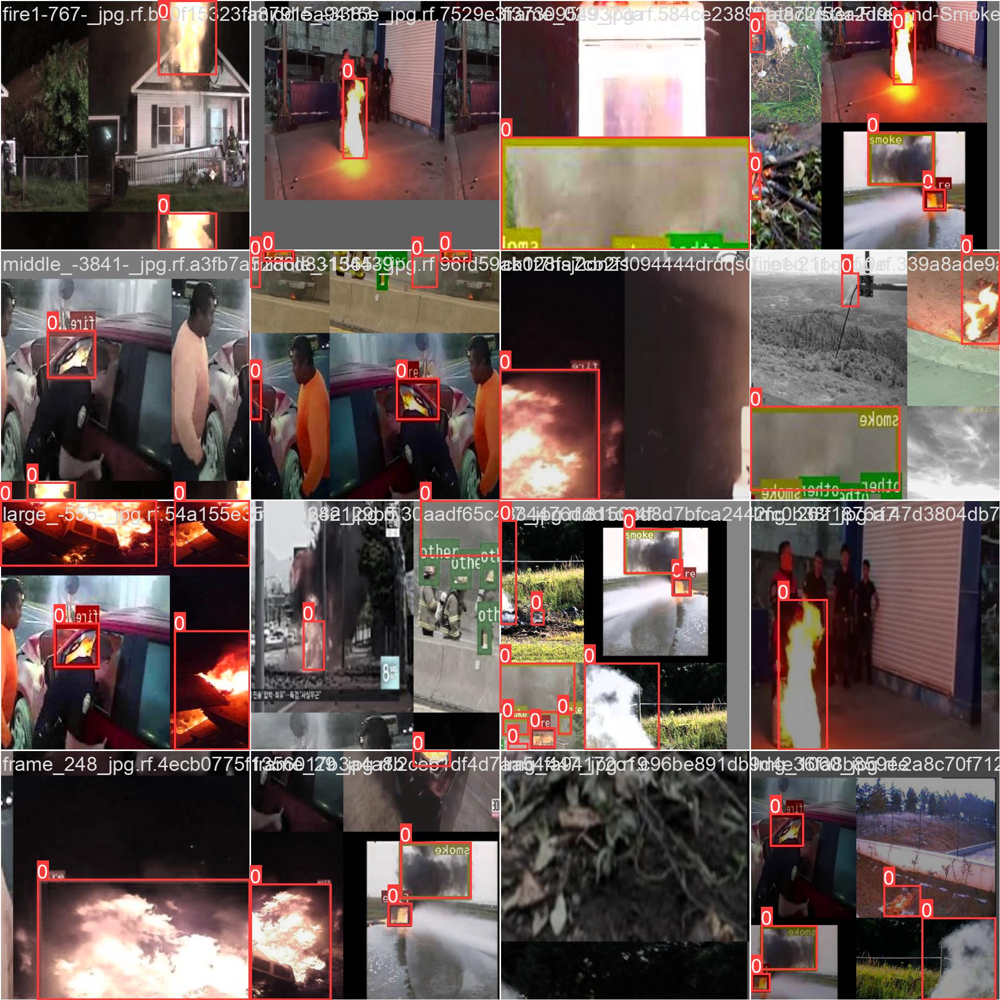

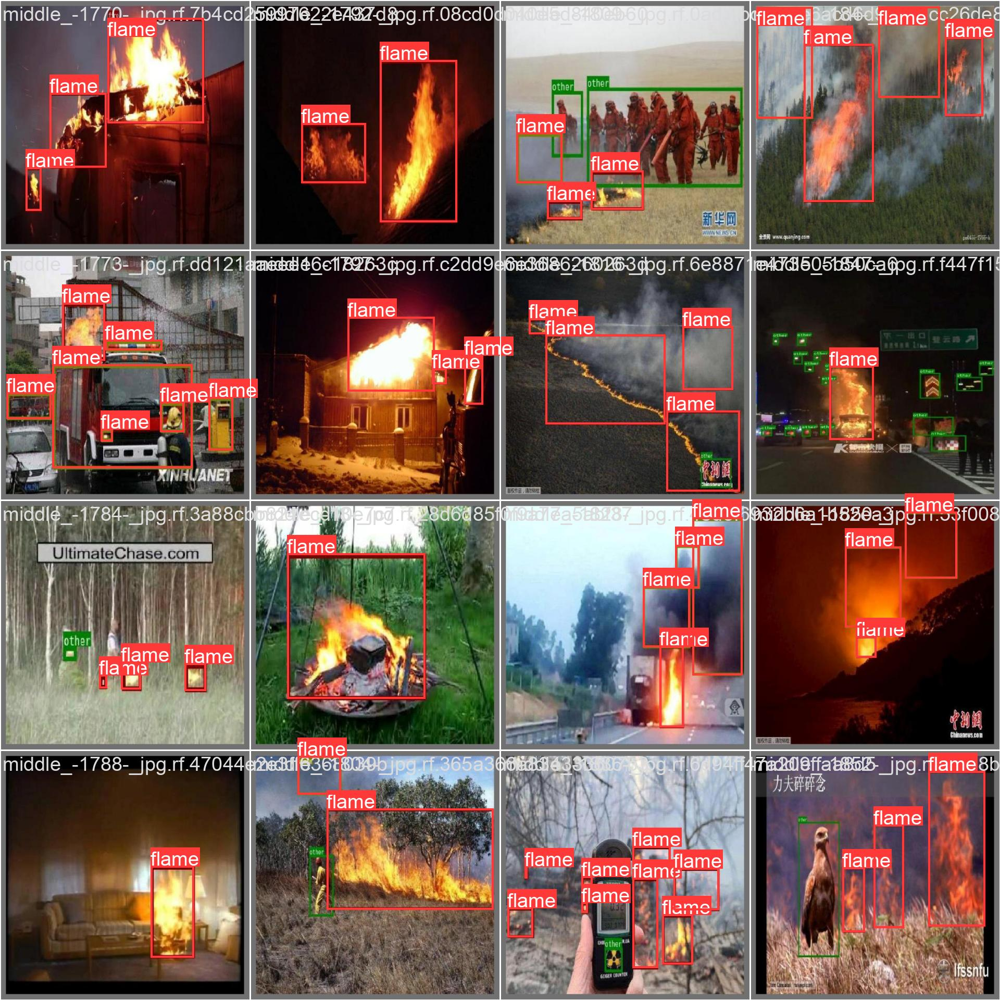

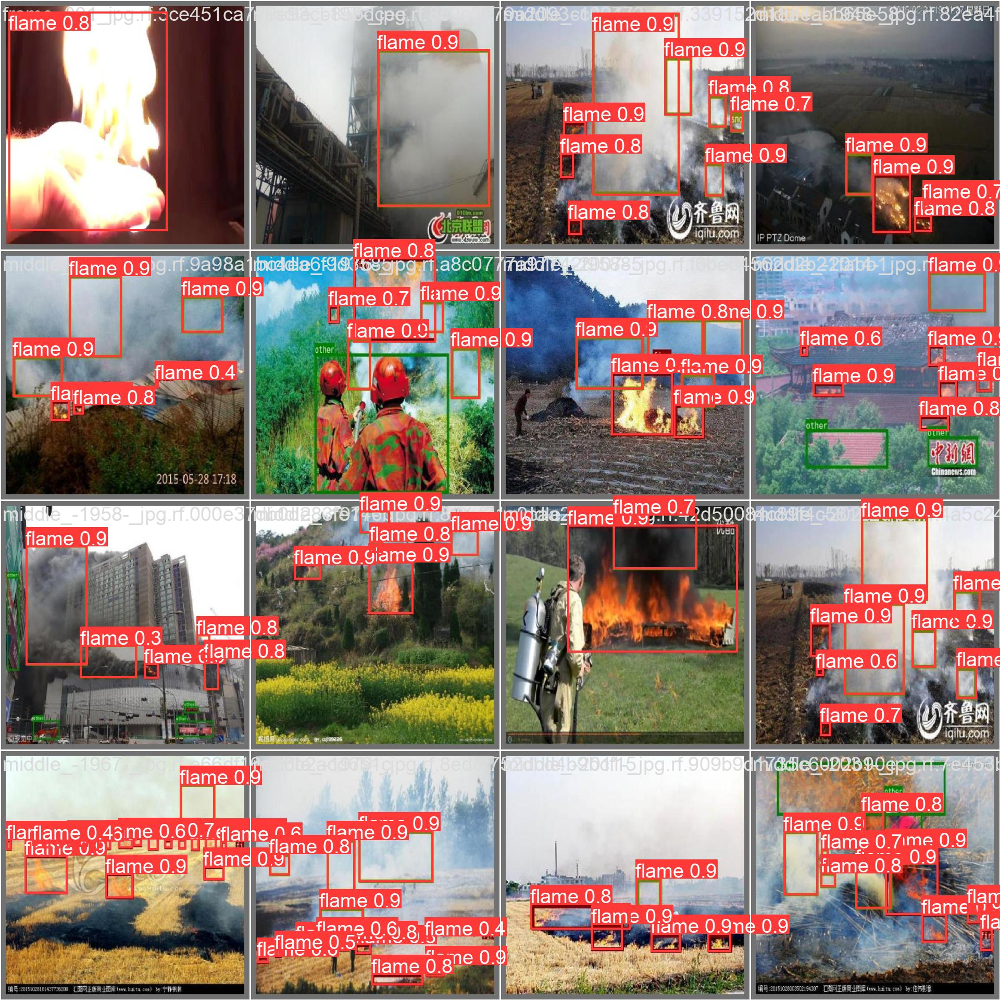

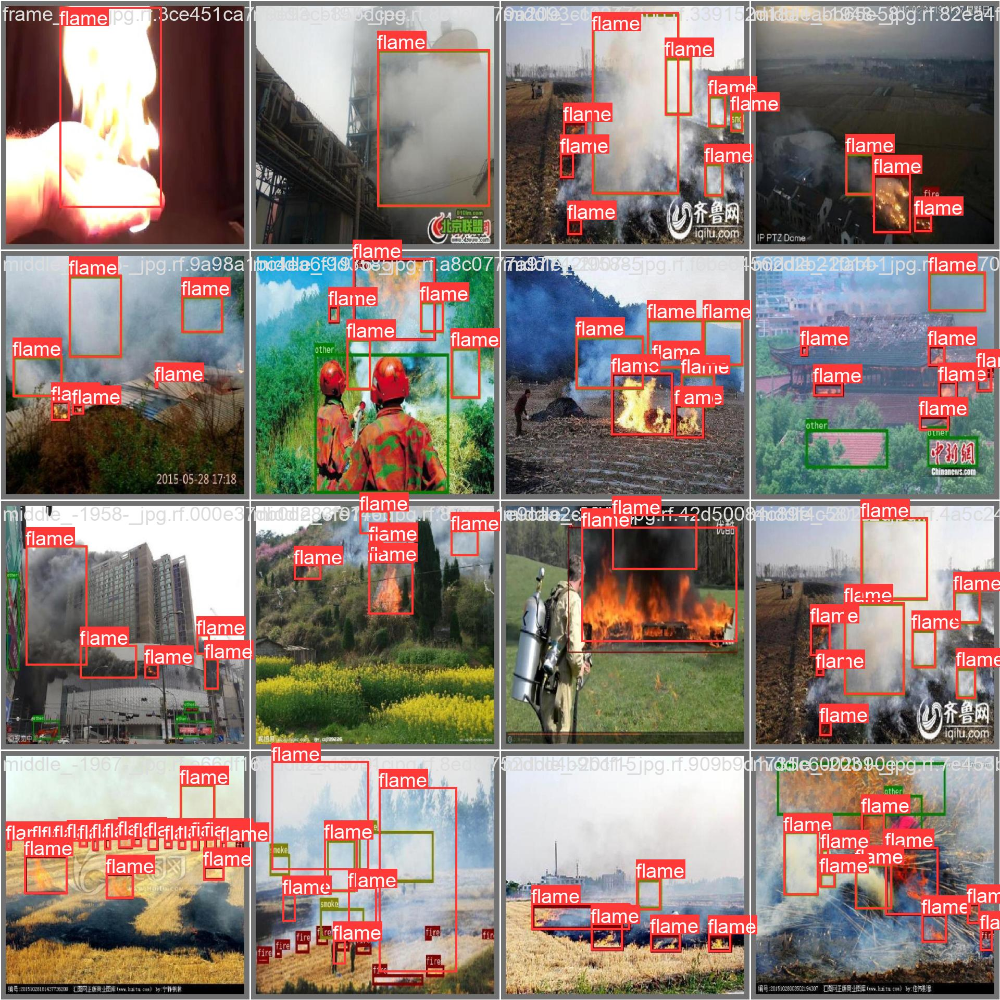

...

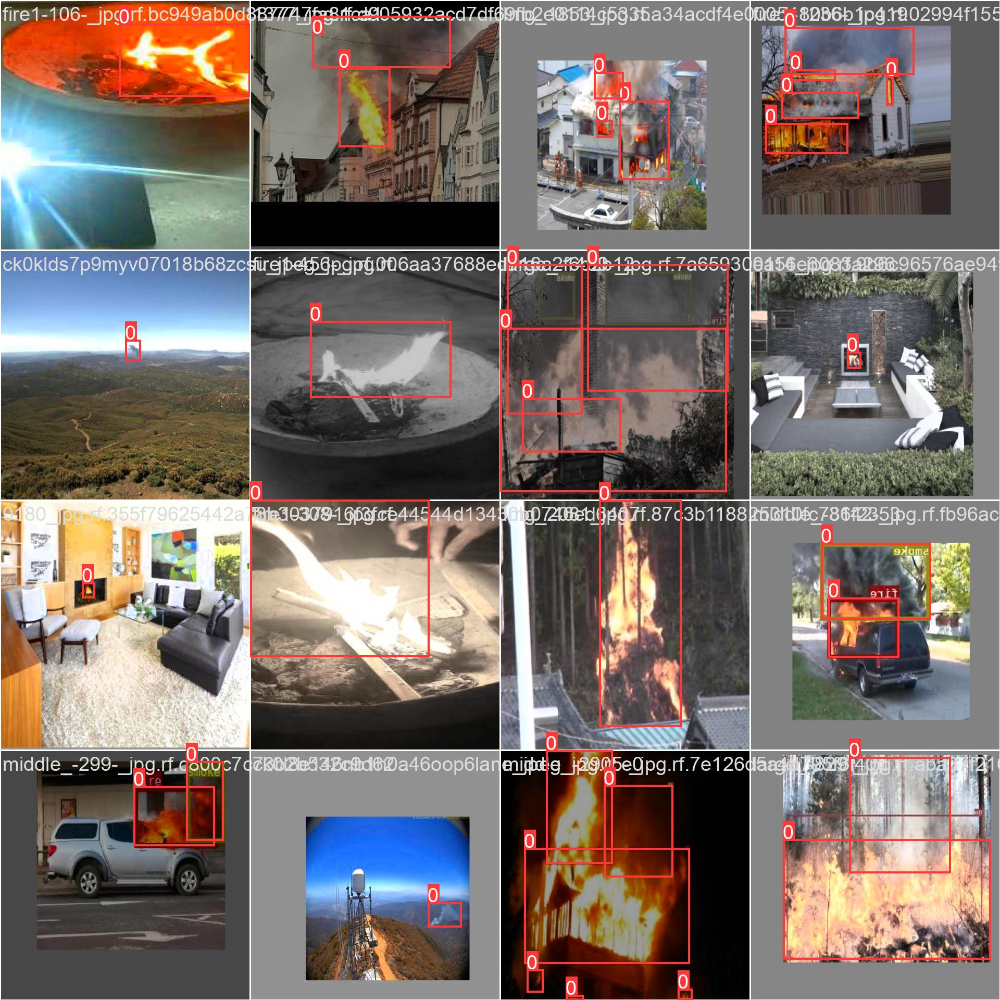

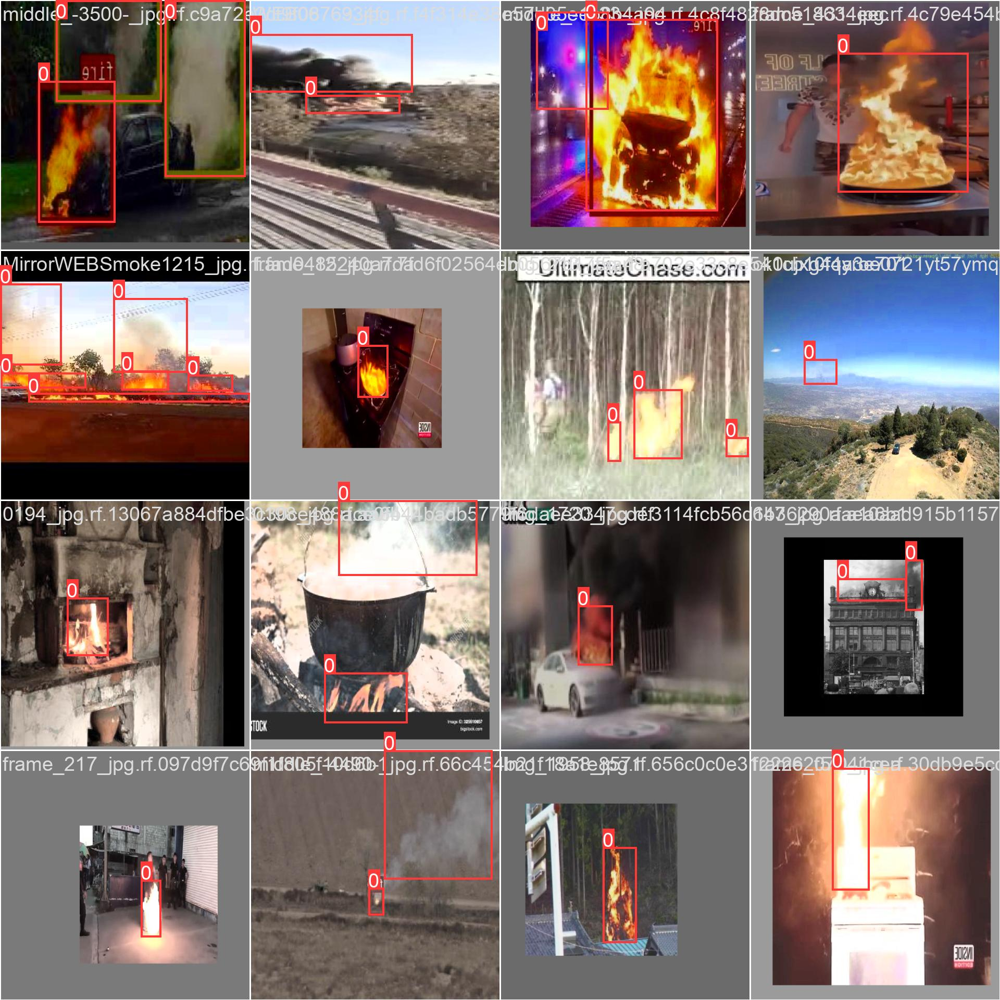

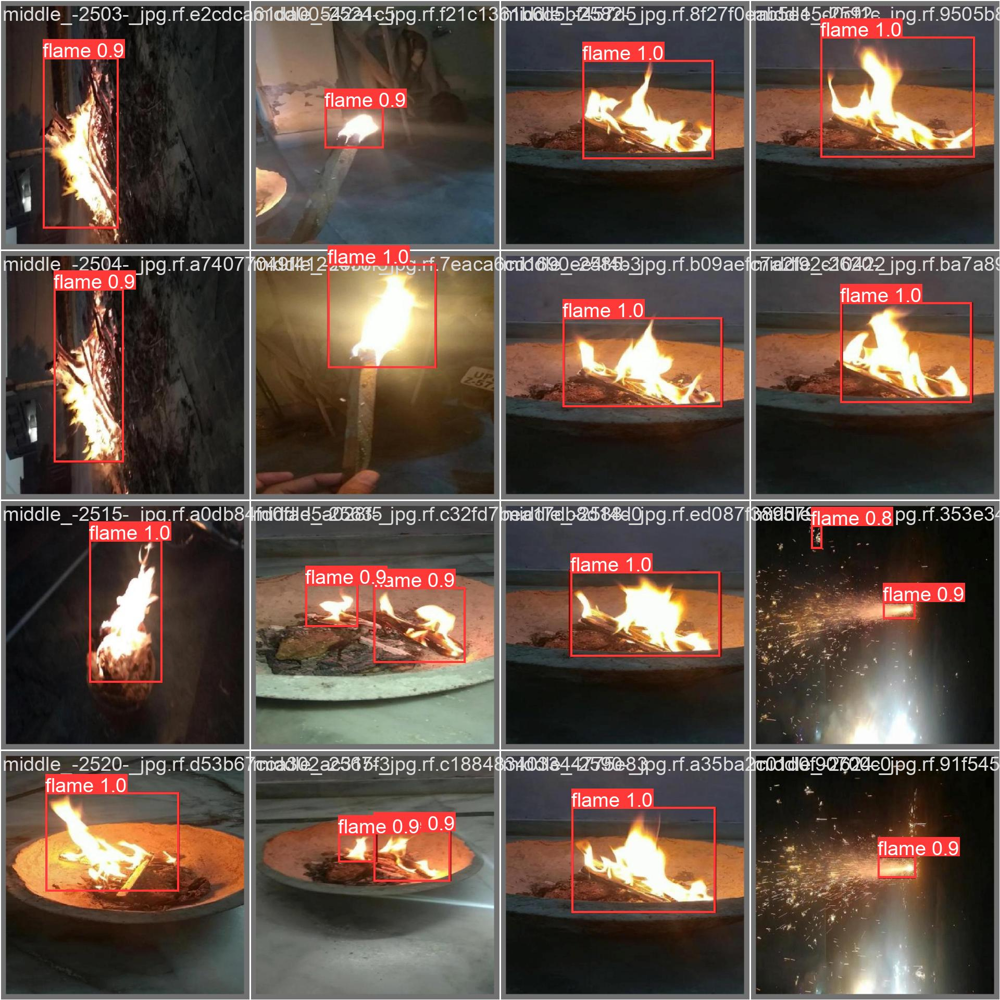

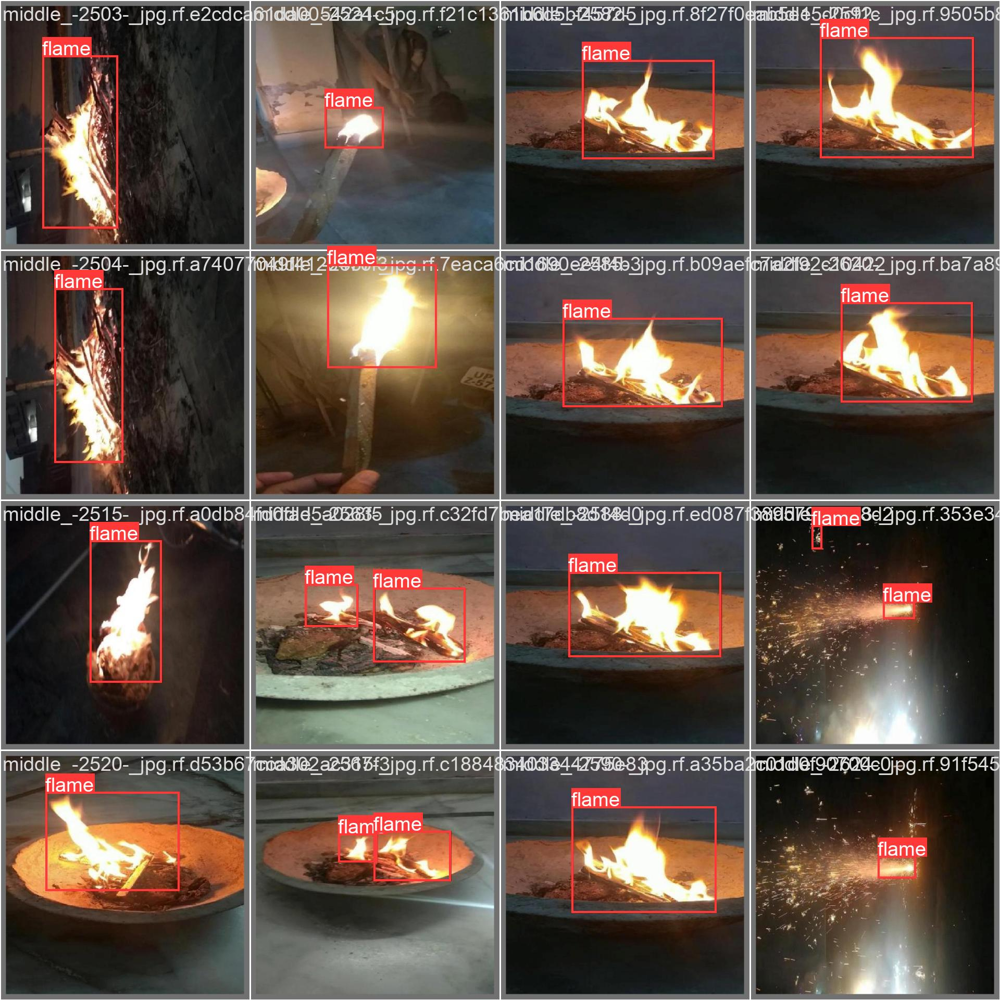

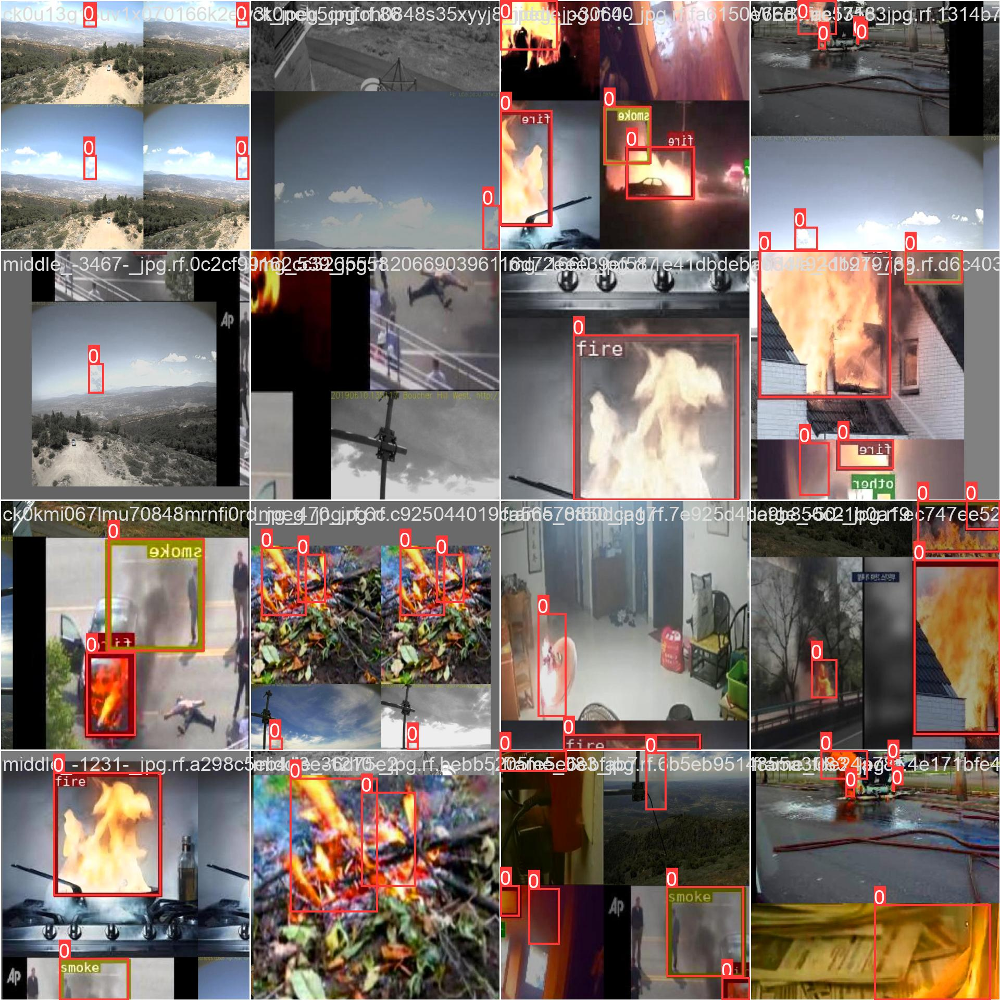

In [34]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/train3/batches/*.jpg'):
      display(Image(filename=image_path, width=600))
      print("\n")